In [1]:
from nltk import sent_tokenize
from flair.nn import Classifier
from tqdm import tqdm
from flair.data import Sentence
from collections import Counter
import pandas as pd
import glob
import os
import re
import string
from scipy.sparse import csr_matrix
import numpy as np
import community
import networkx as nx
from collections import defaultdict
from ast import literal_eval
from fuzzywuzzy import fuzz
import matplotlib.pyplot as plt
import PyPDF2
from pylab import rcParams
rcParams['figure.figsize'] = 14, 10

In [2]:
def replace_multiple_strings(text, replacements):
    for old_str, new_str in replacements.items():
        text = text.replace(old_str, new_str)
    return text

In [3]:
def get_all_files(path, extension='.preprocessed'):
    return glob.glob(f"{path}/*{extension}")

In [4]:
def get_livre(path):
    _, file_name  = os.path.split(path)
    livre = file_name.split('.')[0]
    return livre

In [5]:
def create_graph(path):
    edges_df = pd.read_csv(path)
    G = nx.from_pandas_edgelist(edges_df, edge_attr = True)
    nodes = list(G.nodes)
    replacements = {"step03": "step02", "interact": "alias"} 
    alias_path = replace_multiple_strings(path, replacements)
    alias_df = pd.read_csv(alias_path)
    for _, row in alias_df.iterrows():
        if row['name'] in nodes:
            names = eval(row['alias'])
            G.nodes[row['name']]['names'] = ";".join(names)
    return G

In [6]:
def step_04(paths=None):
    paths = ['train/step03/']
        
    graph_dict = {'ID': [], 'graphml': []}
    for path in tqdm(paths):
        all_chapter_path = get_all_files(path, ".interact")
        for chapter_path in all_chapter_path:
            print(f"Livre: {get_livre(chapter_path)}")
            graph_dict['ID'].append(get_livre(chapter_path))
            G = create_graph(chapter_path)
            graphml = "".join(nx.generate_graphml(G))
            graph_dict['graphml'].append(graphml)
    
    graph_df = pd.DataFrame(graph_dict)
    graph_df.set_index("ID", inplace=True)
    graph_df.to_csv("train/my_submission.csv")

In [7]:
step_04()

100%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 1/1 [00:00<00:00, 28.17it/s]

Livre: Fondation_foudroyée_sample
Livre: Fondation_et_empire_sample
Livre: Fondation_sample
Livre: Seconde_Fondation_sample
Livre: Terre_et_Fondation_sample


In [8]:
def create_graphs():
    paths = [
        'train/step03/'
    ]
        
    graph_dict = {'ID': [], 'graphml': []}
    graphs = {}
    for path in paths:
        all_chapter_path = get_all_files(path, ".interact")
        for chapter_path in all_chapter_path:
            print(f"Livre: {get_livre(chapter_path)}")
            key_1 = f'{path}chapter_'
            chapitre = replace_multiple_strings(chapter_path, 
                                                {
                                                    key_1:'',
                                                     '.txt.interact':''
                                                })
            G = create_graph(chapter_path)
            gid = get_livre(chapter_path)
            graphs[gid] = G       
    return graphs

In [9]:
graphs = create_graphs()

Livre: Fondation_foudroyée_sample
Livre: Fondation_et_empire_sample
Livre: Fondation_sample
Livre: Seconde_Fondation_sample
Livre: Terre_et_Fondation_sample


In [10]:
len(graphs)

5

In [11]:
graphs.keys()

dict_keys(['Fondation_foudroyée_sample', 'Fondation_et_empire_sample', 'Fondation_sample', 'Seconde_Fondation_sample', 'Terre_et_Fondation_sample'])

In [12]:
def show_graph(graph, title):
    pos = nx.circular_layout(graph, scale = 20)
    labels = nx.get_edge_attributes(graph, 'weight')
    d = dict(graph.degree)
    nx.draw(
        graph, 
        pos,
        node_color='lightblue', 
        alpha = 0.75,
        with_labels=True, 
        nodelist=d, 
        node_size=[d[k]*200 for k in d],
        edgelist = labels
    )
    nx.draw_networkx_edge_labels(graph,pos,edge_labels=labels)
    plt.title(f'Graphe: {title}')
    plt.show()

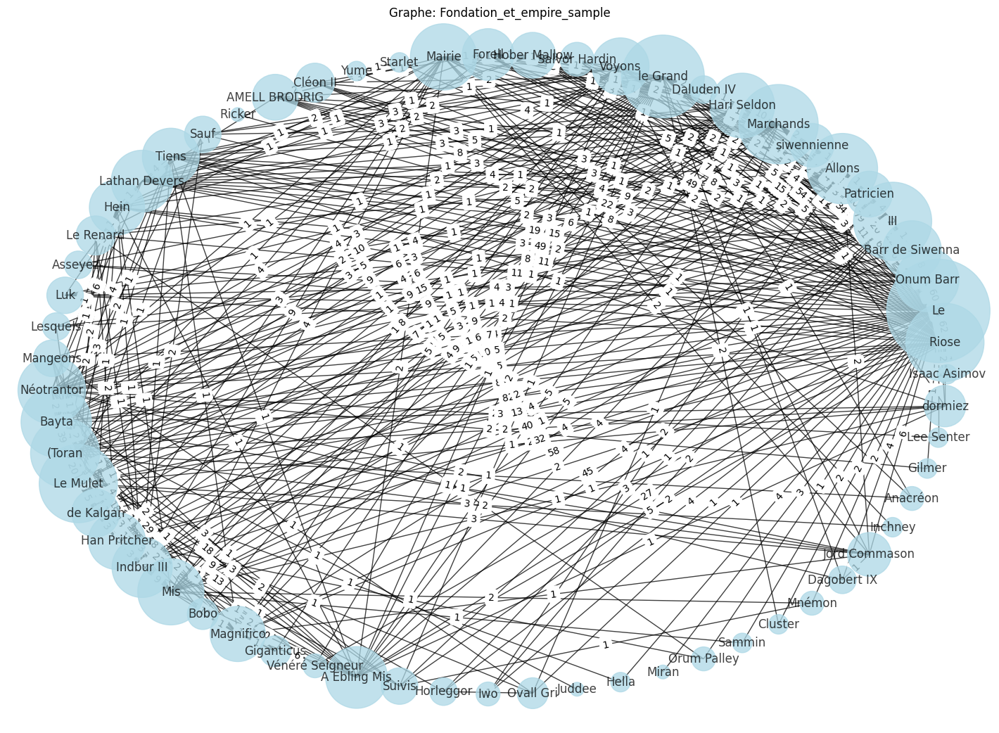

In [13]:
show_graph(graphs['Fondation_et_empire_sample'], 'Fondation_et_empire_sample')

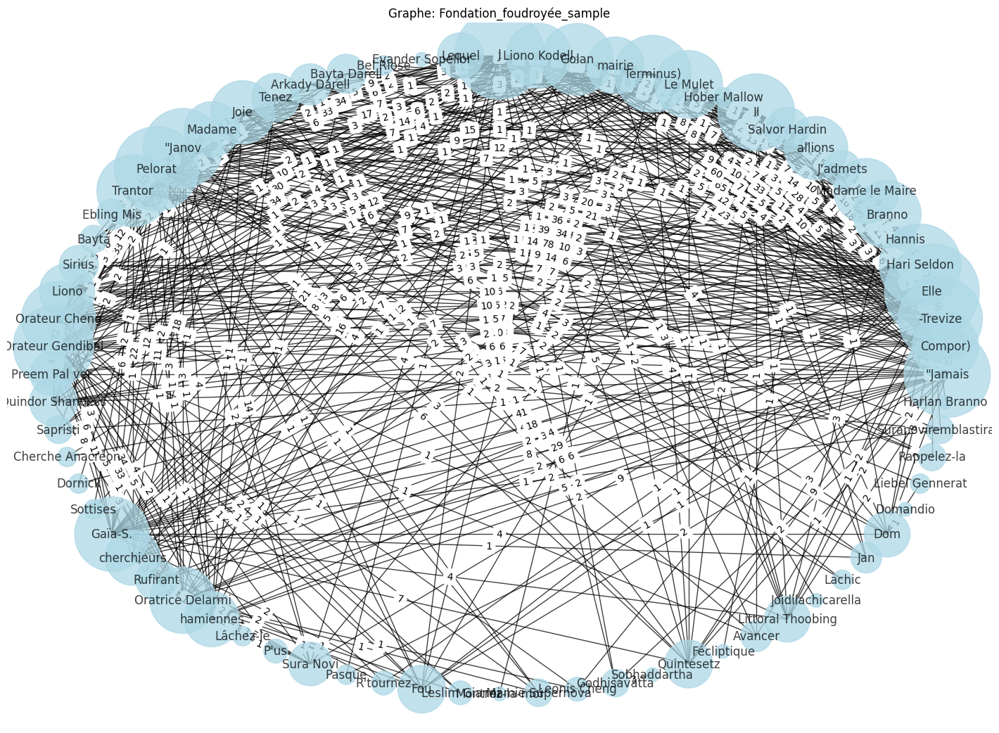

In [14]:
show_graph(graphs['Fondation_foudroyée_sample'], 'Fondation_foudroyée_sample')

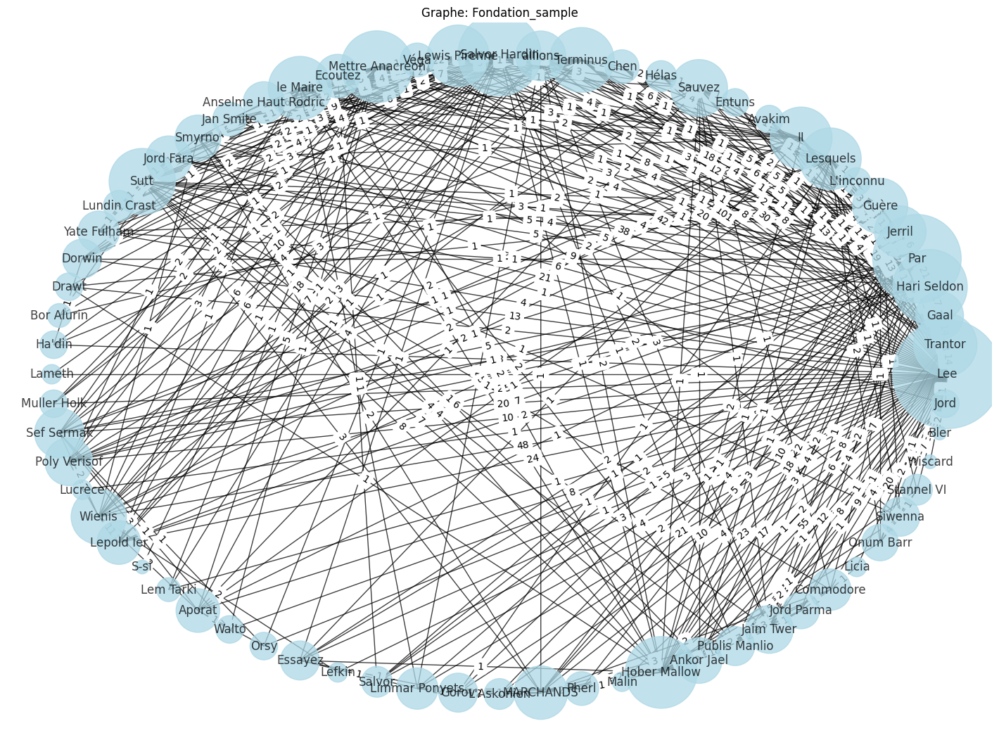

In [15]:
show_graph(graphs['Fondation_sample'], 'Fondation_sample')

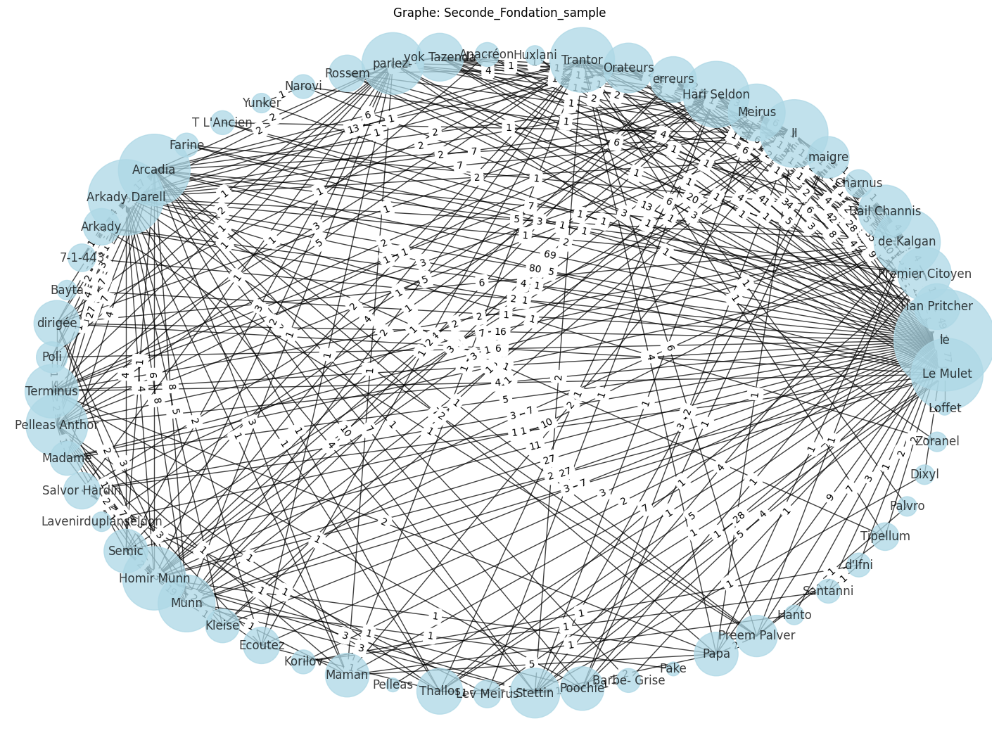

In [16]:
show_graph(graphs['Seconde_Fondation_sample'], 'Seconde_Fondation_sample')

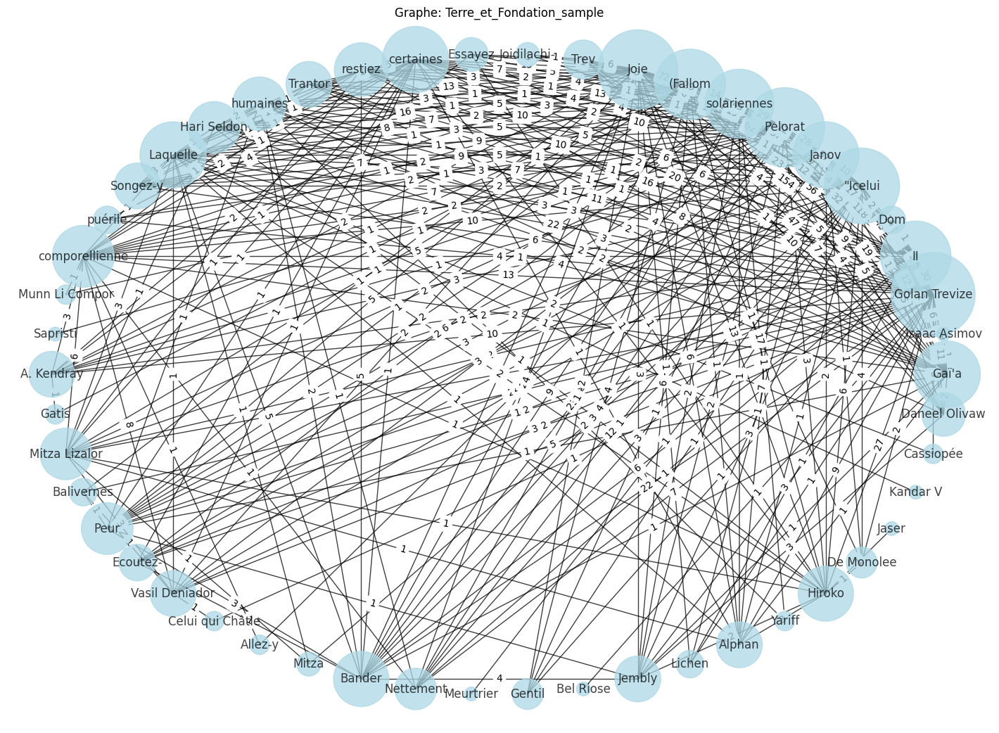

In [17]:
show_graph(graphs['Terre_et_Fondation_sample'], 'Terre_et_Fondation_sample')

In [18]:
def plot_pagerank(graph, title):

    pagerank_scores = nx.pagerank(graph)
    characters = list(pagerank_scores.keys())
    scores = list(pagerank_scores.values())

    plt.bar(characters, scores, color='skyblue')
    plt.xlabel('Characters')
    plt.ylabel('PageRank Score')
    plt.title('PageRank Scores for Characters')
    plt.xticks(rotation=45, ha='right')
    plt.tight_layout()
    plt.title(f'Graphe: {title}')
    plt.show()

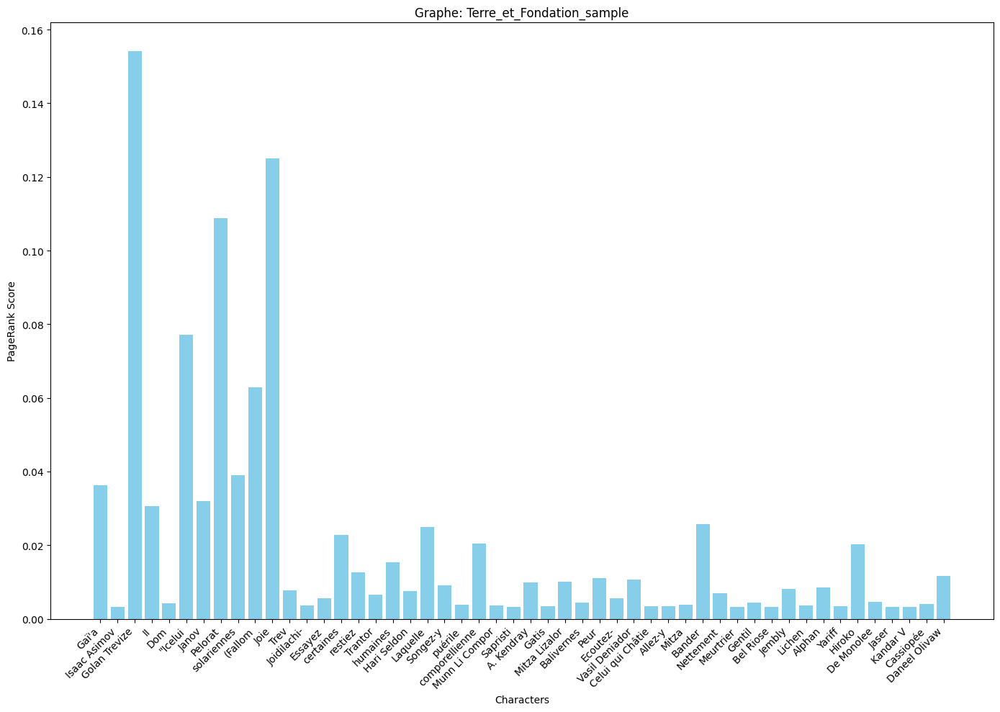

In [19]:
plot_pagerank(graphs['Terre_et_Fondation_sample'], 'Terre_et_Fondation_sample')

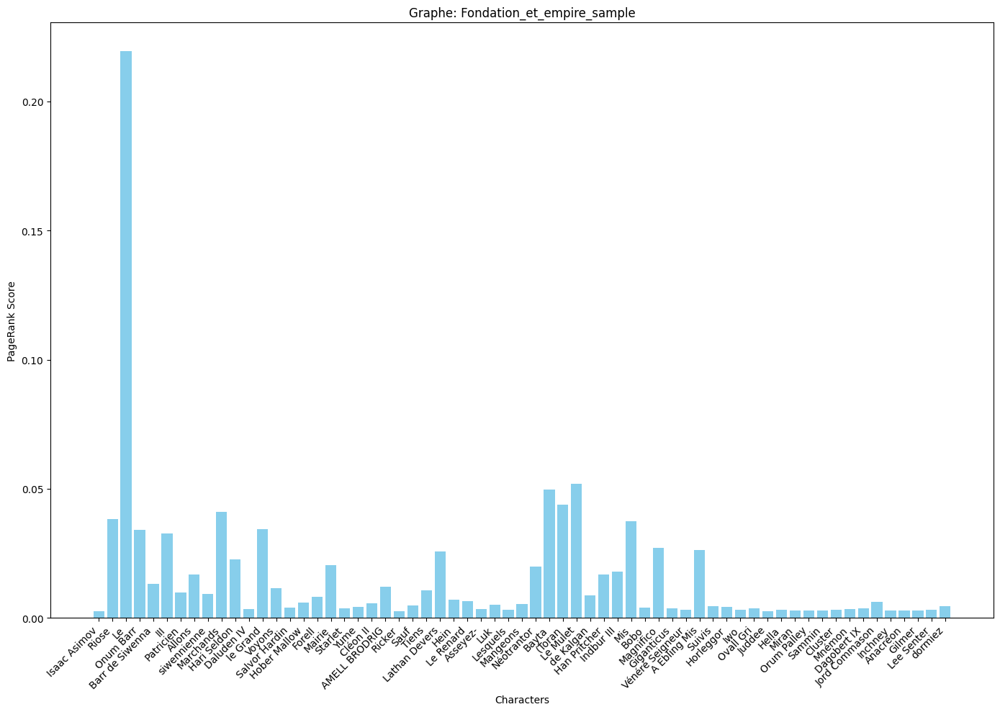

In [20]:
plot_pagerank(graphs['Fondation_et_empire_sample'], 'Fondation_et_empire_sample')

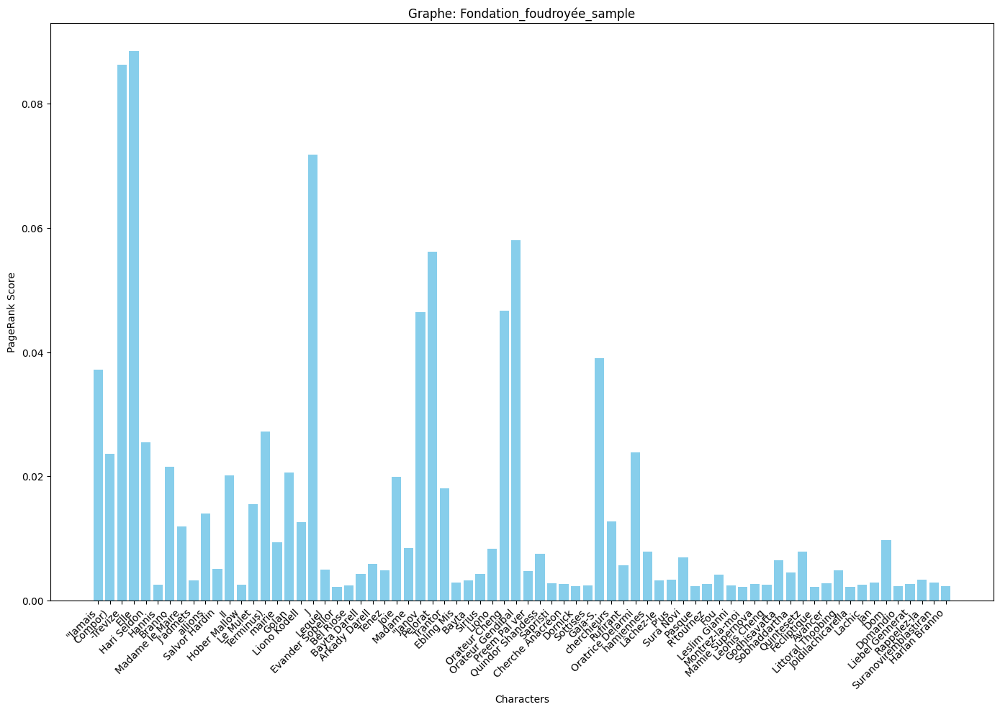

In [21]:
plot_pagerank(graphs['Fondation_foudroyée_sample'], 'Fondation_foudroyée_sample')

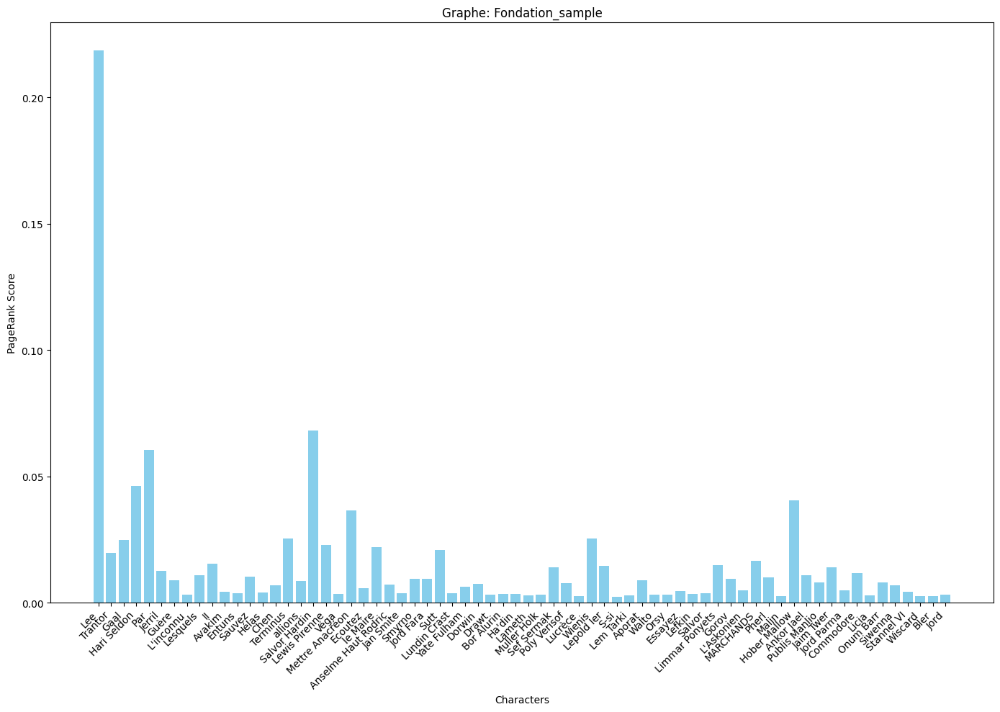

In [22]:
plot_pagerank(graphs['Fondation_sample'], 'Fondation_sample')

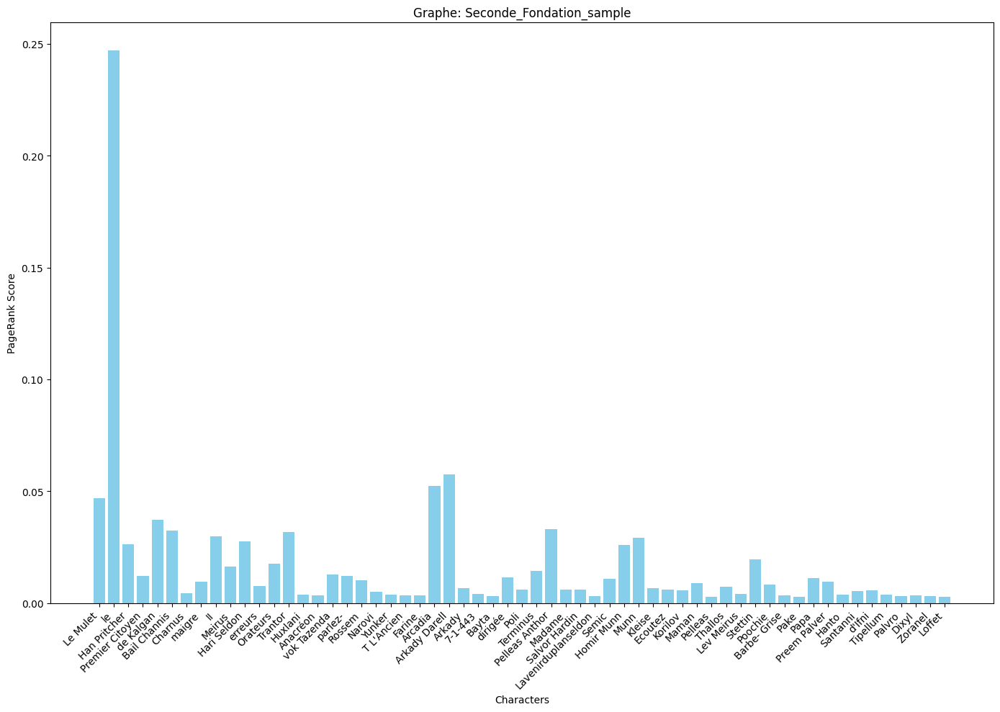

In [23]:
plot_pagerank(graphs['Seconde_Fondation_sample'], 'Seconde_Fondation_sample')

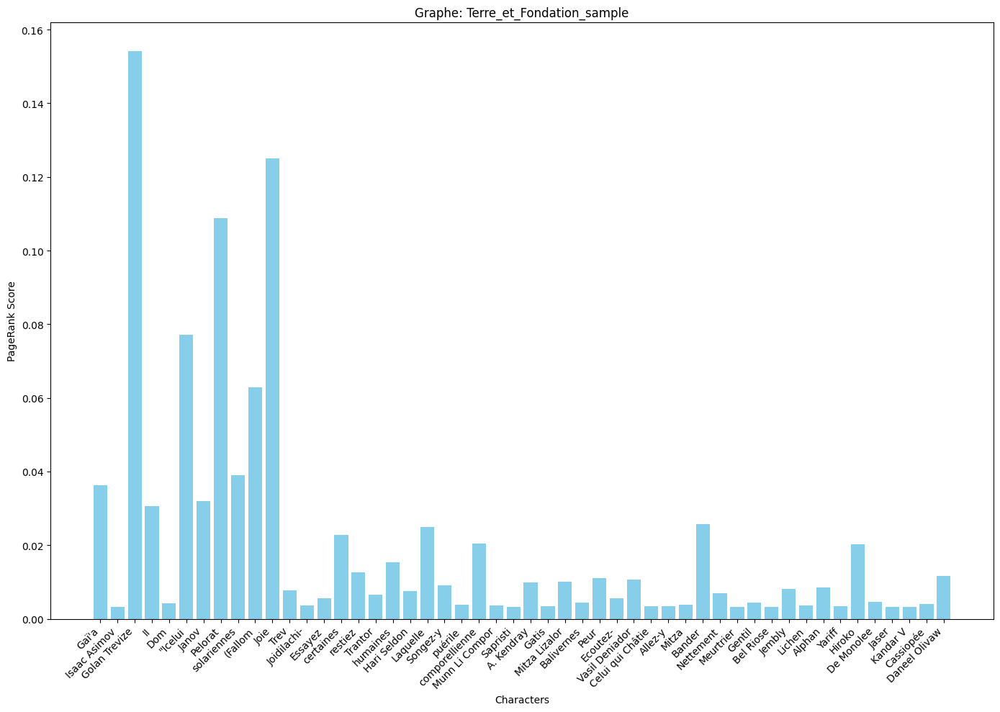

In [24]:
plot_pagerank(graphs['Terre_et_Fondation_sample'], 'Terre_et_Fondation_sample')

In [25]:
def plot_eigenvector(graph, title):
    
    eigenvector_scores = nx.eigenvector_centrality(graph, weight='weight')
    characters = list(eigenvector_scores.keys())
    scores = list(eigenvector_scores.values())

    plt.bar(characters, scores, color='skyblue')
    plt.xlabel('Characters')
    plt.ylabel('Eigenvector Score')
    plt.title('Eigenvector Score for Characters')
    plt.xticks(rotation=45, ha='right')
    plt.tight_layout()

    plt.title(f'Graphe: {title}')
    plt.show()

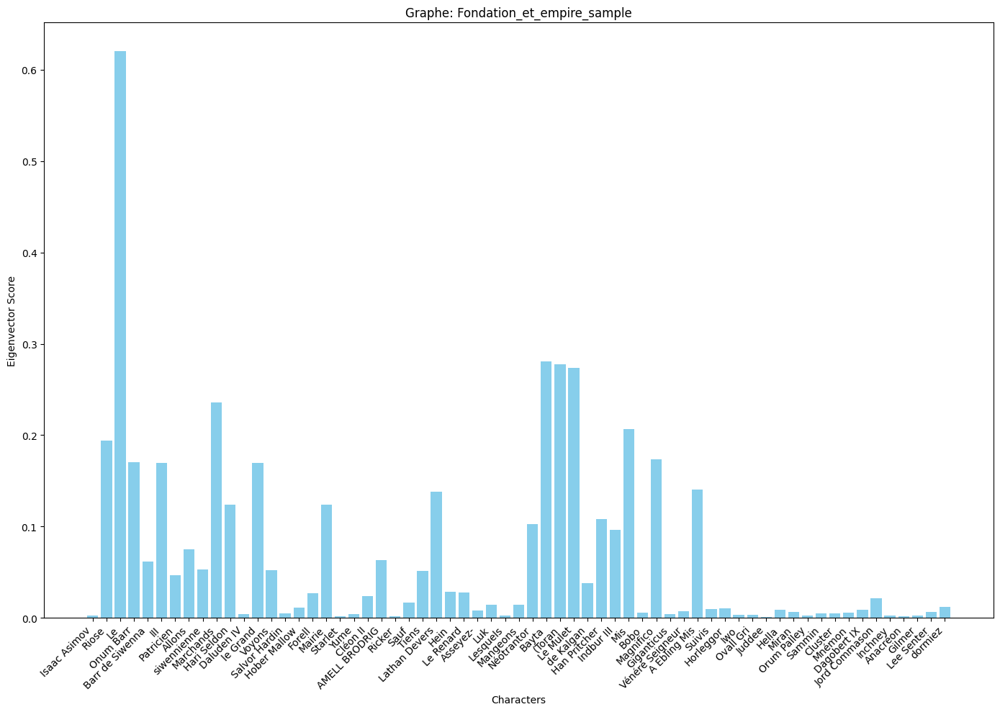

In [26]:
plot_eigenvector(graphs['Fondation_et_empire_sample'], 'Fondation_et_empire_sample')

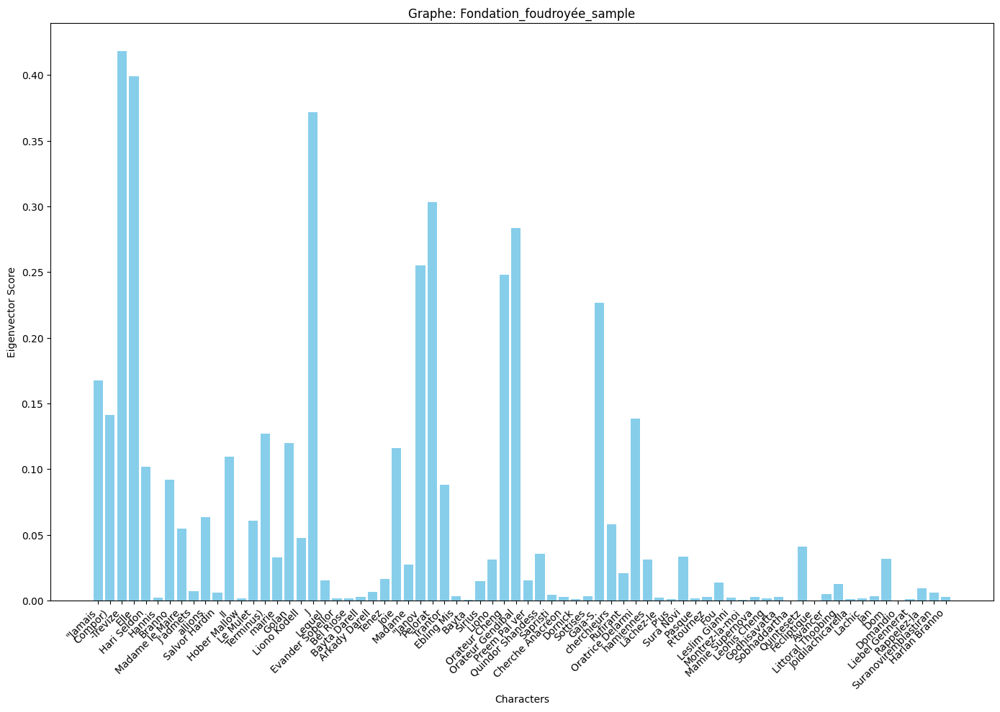

In [27]:
plot_eigenvector(graphs['Fondation_foudroyée_sample'], 'Fondation_foudroyée_sample')

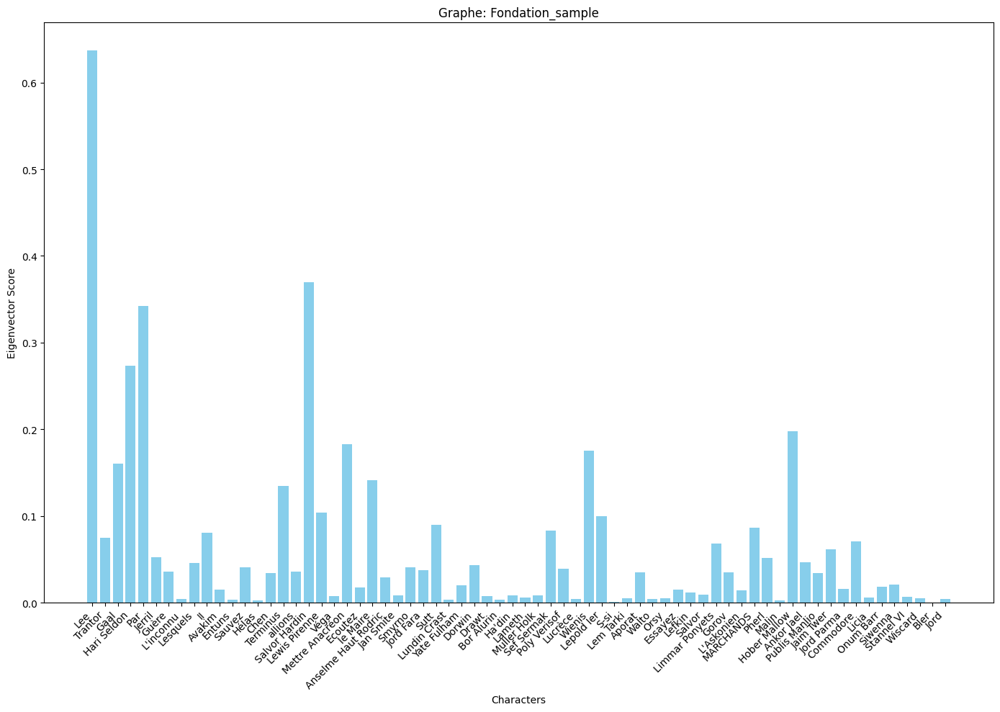

In [28]:
plot_eigenvector(graphs['Fondation_sample'], 'Fondation_sample')

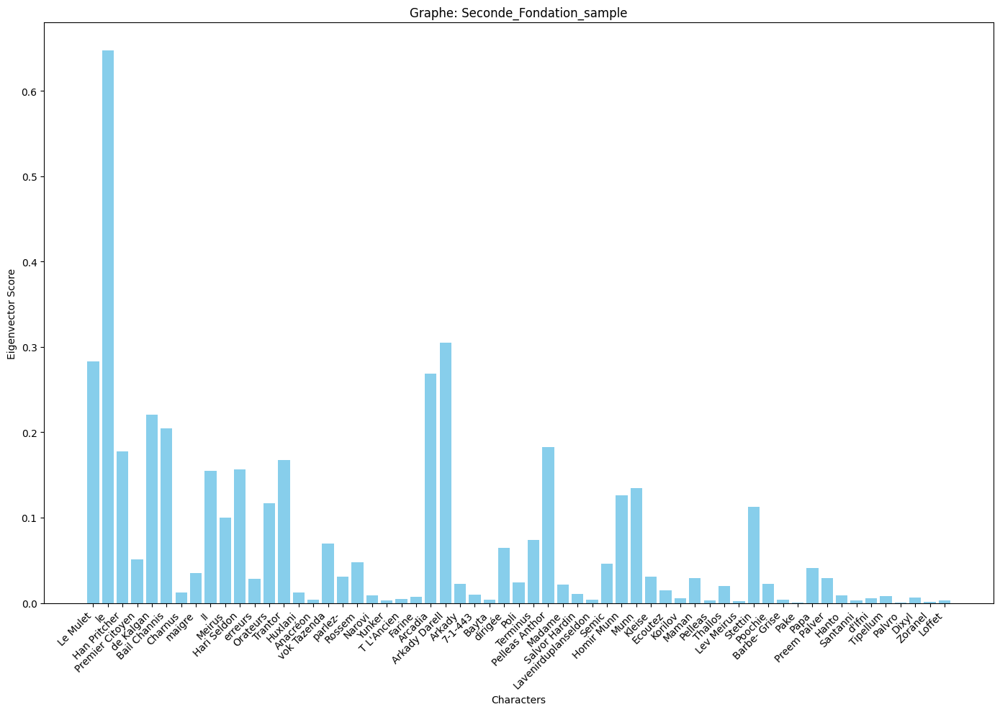

In [29]:
plot_eigenvector(graphs['Seconde_Fondation_sample'], 'Seconde_Fondation_sample')

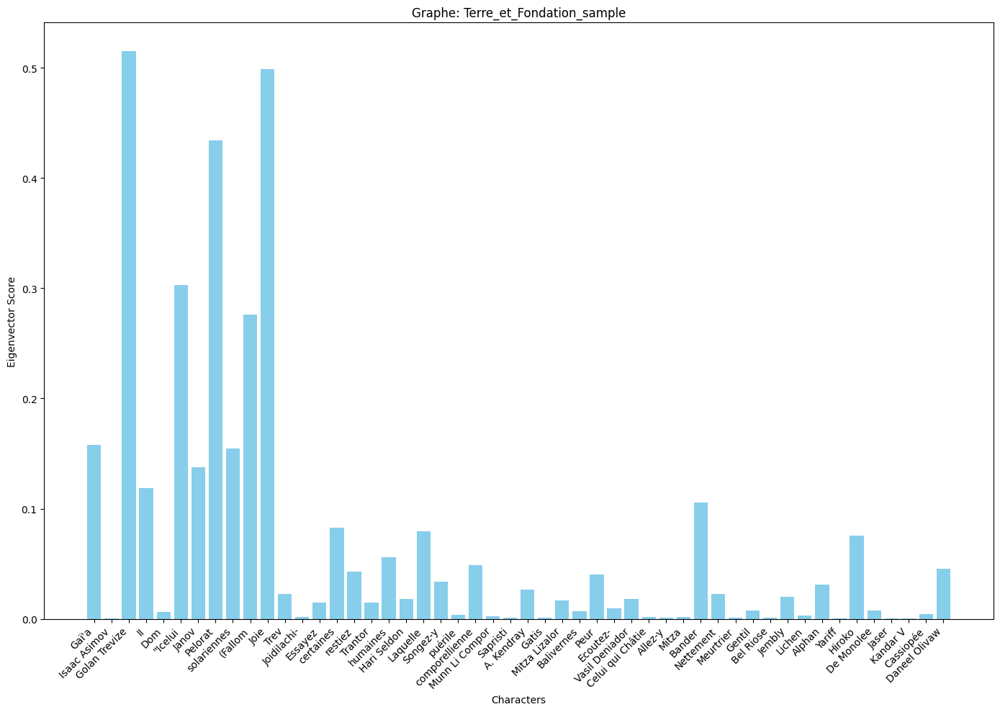

In [30]:
plot_eigenvector(graphs['Terre_et_Fondation_sample'], 'Terre_et_Fondation_sample')

In [31]:
def plot_betweeness(graph, title):
    
    betweenness_scores = nx.betweenness_centrality(graph, weight='weight', seed=0)
    characters = list(betweenness_scores.keys())
    scores = list(betweenness_scores.values())

    plt.bar(characters, scores, color='skyblue')
    plt.xlabel('Characters')
    plt.ylabel('Betweenness Score')
    plt.title('Betweenness Score for Characters')
    plt.xticks(rotation=45, ha='right')
    plt.tight_layout()
    plt.title(f'Graphe: {title}')
    plt.show()

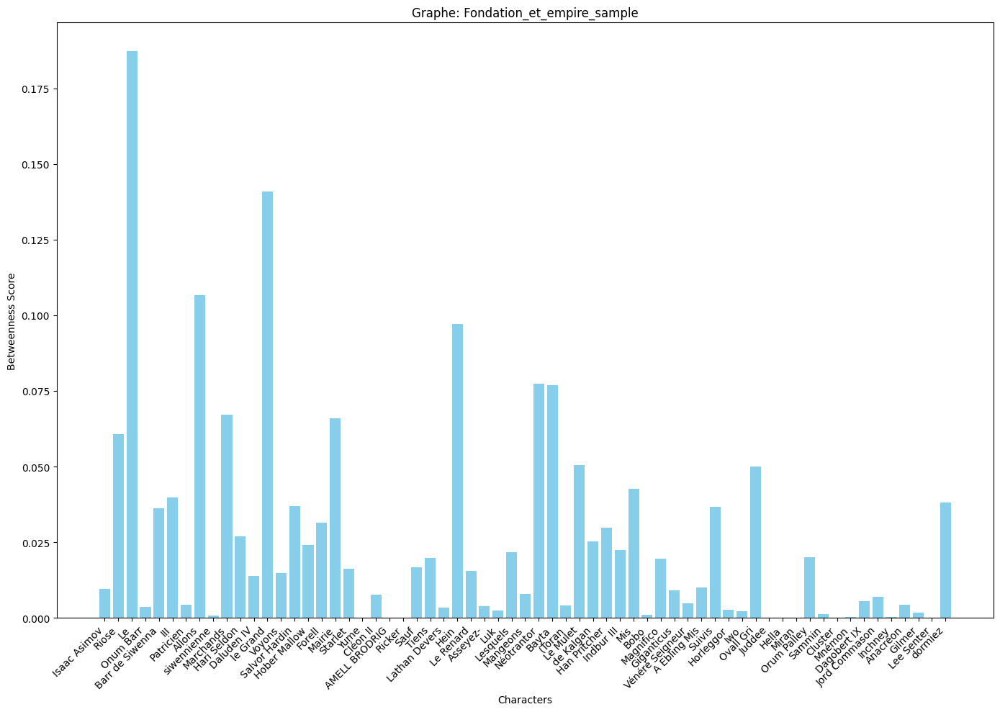

In [32]:
plot_betweeness(graphs['Fondation_et_empire_sample'], 'Fondation_et_empire_sample')

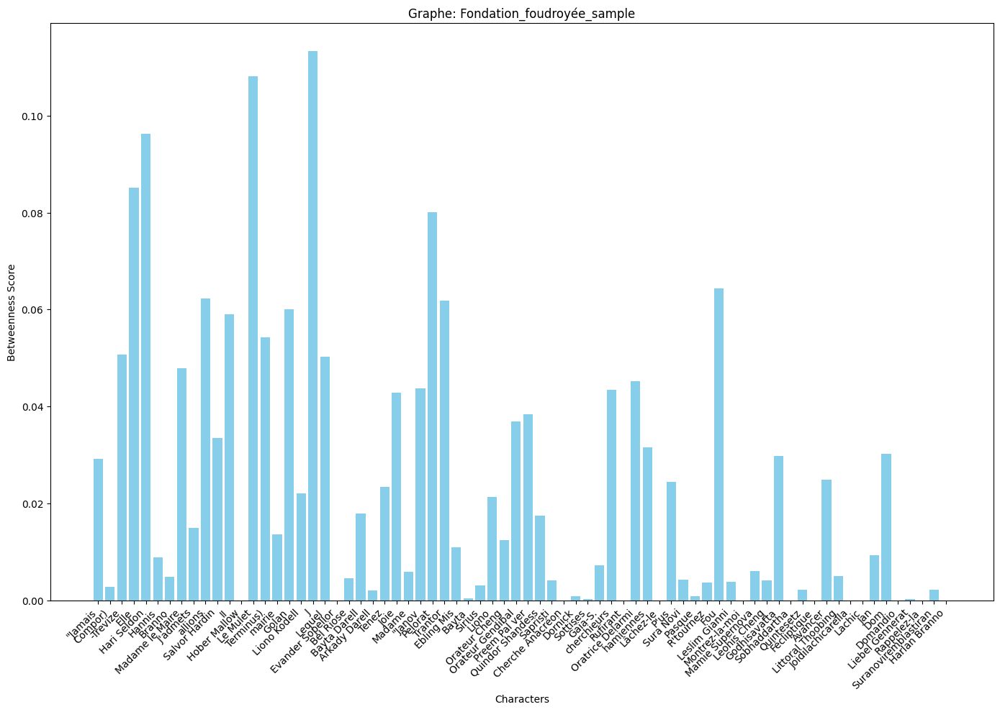

In [33]:
plot_betweeness(graphs['Fondation_foudroyée_sample'], 'Fondation_foudroyée_sample')

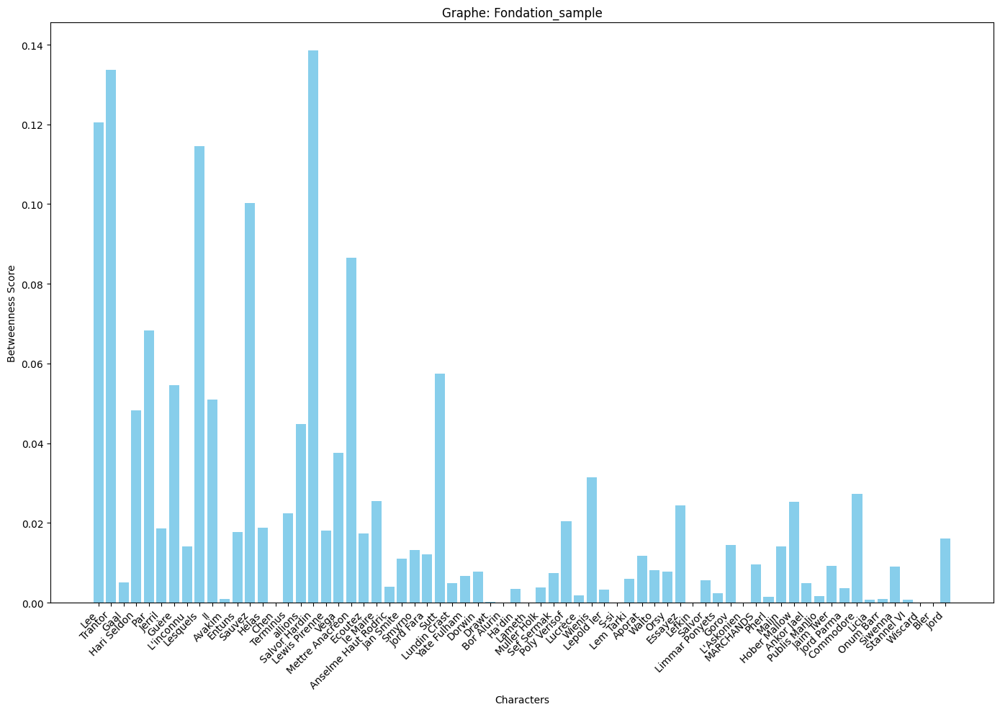

In [34]:
plot_betweeness(graphs['Fondation_sample'], 'Fondation_sample')

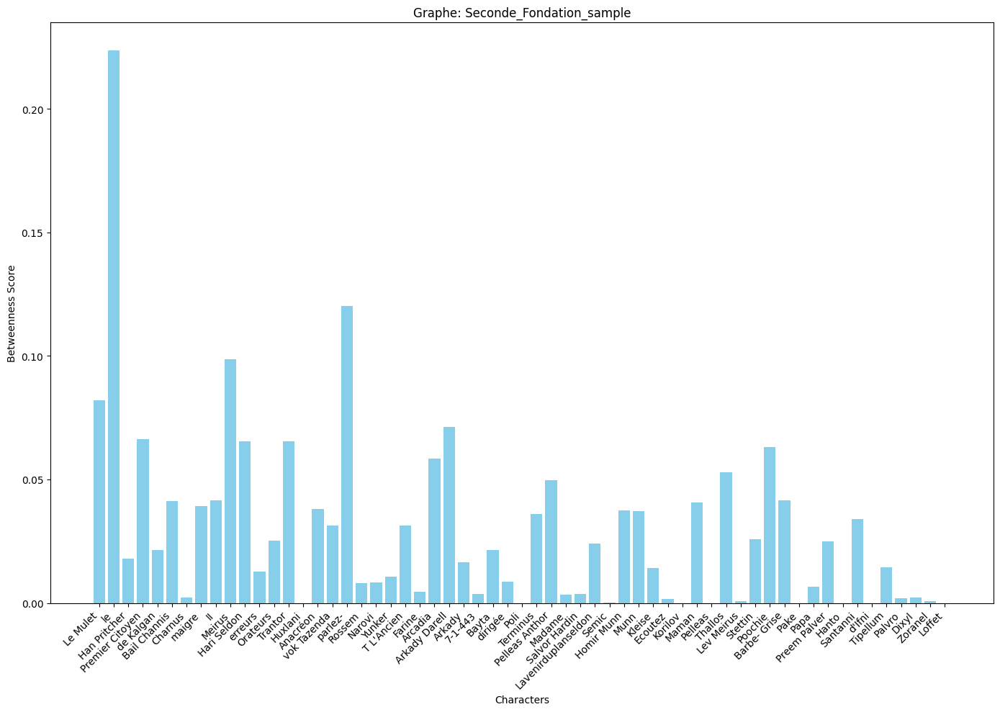

In [35]:
plot_betweeness(graphs['Seconde_Fondation_sample'], 'Seconde_Fondation_sample')

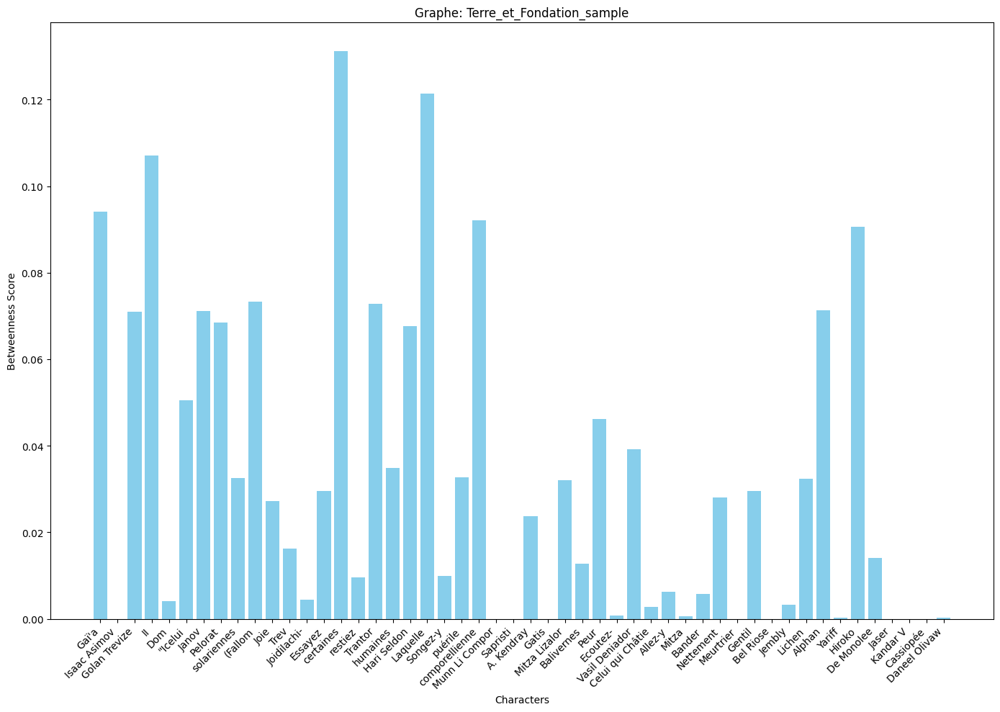

In [36]:
plot_betweeness(graphs['Terre_et_Fondation_sample'], 'Terre_et_Fondation_sample')

In [37]:
def plot_degree(graph, title):
    from pylab import rcParams
    rcParams['figure.figsize'] = 14, 10
    
    degree_scores = dict(nx.degree(graph, weight='weight'))
    characters = list(degree_scores.keys())
    scores = list(degree_scores.values())

    plt.bar(characters, scores, color='skyblue')
    plt.xlabel('Characters')
    plt.ylabel('Degree Score')
    plt.title('Degree Score for Characters')
    plt.xticks(rotation=45, ha='right')
    plt.tight_layout()

    plt.title(f'Graphe: {title}')
    plt.show()

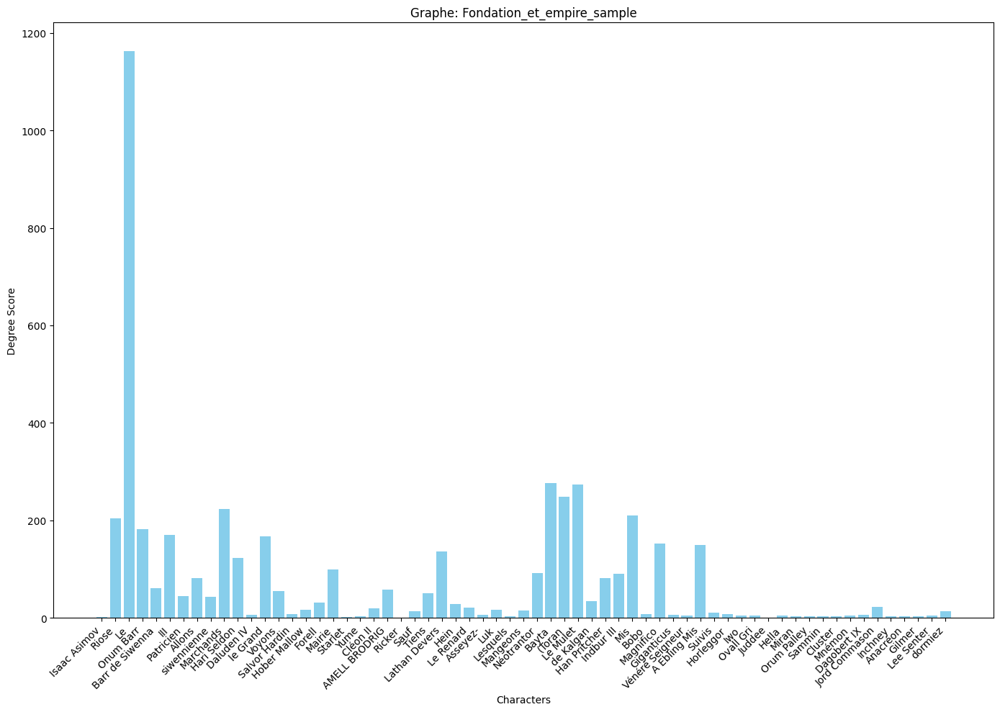

In [38]:
plot_degree(graphs['Fondation_et_empire_sample'], 'Fondation_et_empire_sample')

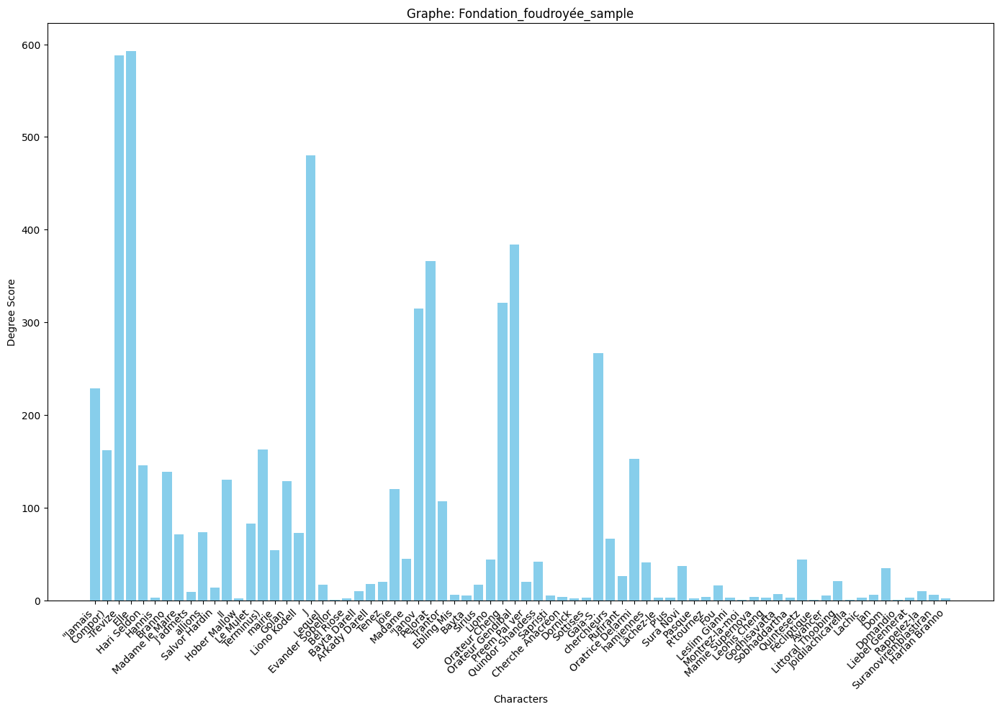

In [39]:
plot_degree(graphs['Fondation_foudroyée_sample'], 'Fondation_foudroyée_sample')

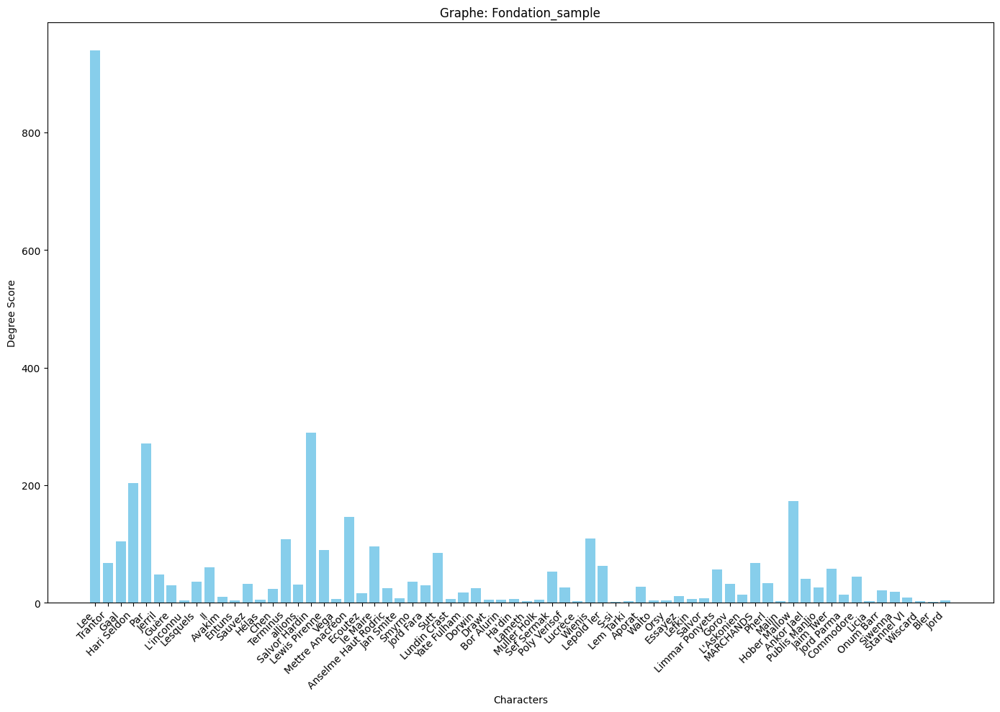

In [40]:
plot_degree(graphs['Fondation_sample'], 'Fondation_sample')

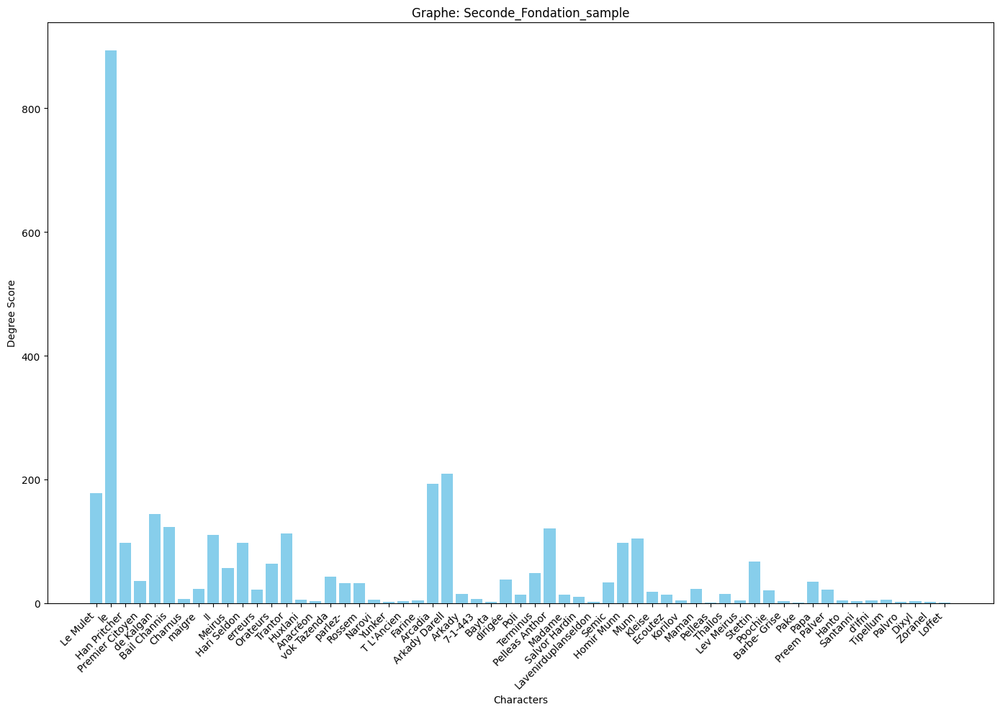

In [41]:
plot_degree(graphs['Seconde_Fondation_sample'], 'Seconde_Fondation_sample')

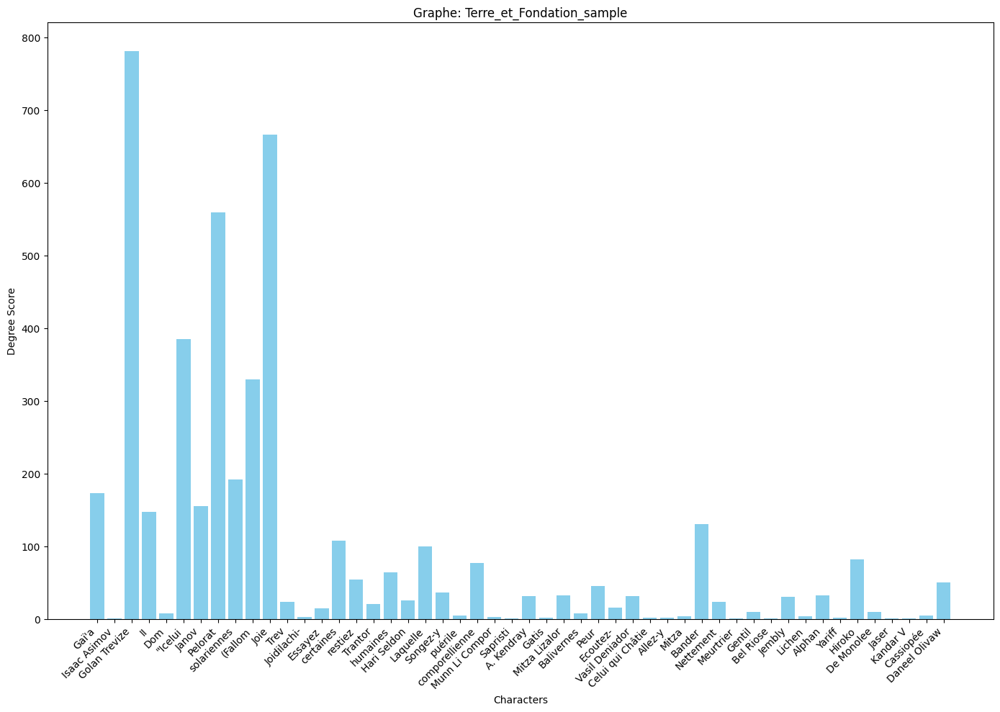

In [42]:
plot_degree(graphs['Terre_et_Fondation_sample'], 'Terre_et_Fondation_sample')

In [43]:
def plot_closeness(graph, title):
    
    closeness_scores = nx.closeness_centrality(graph)
    characters = list(closeness_scores.keys())
    scores = list(closeness_scores.values())

    plt.bar(characters, scores, color='skyblue')
    plt.xlabel('Characters')
    plt.ylabel('Closeness Score')
    plt.title('Closeness Score for Characters')
    plt.xticks(rotation=45, ha='right')
    plt.tight_layout()

    plt.title(f'Graphe: {title}')
    plt.show()

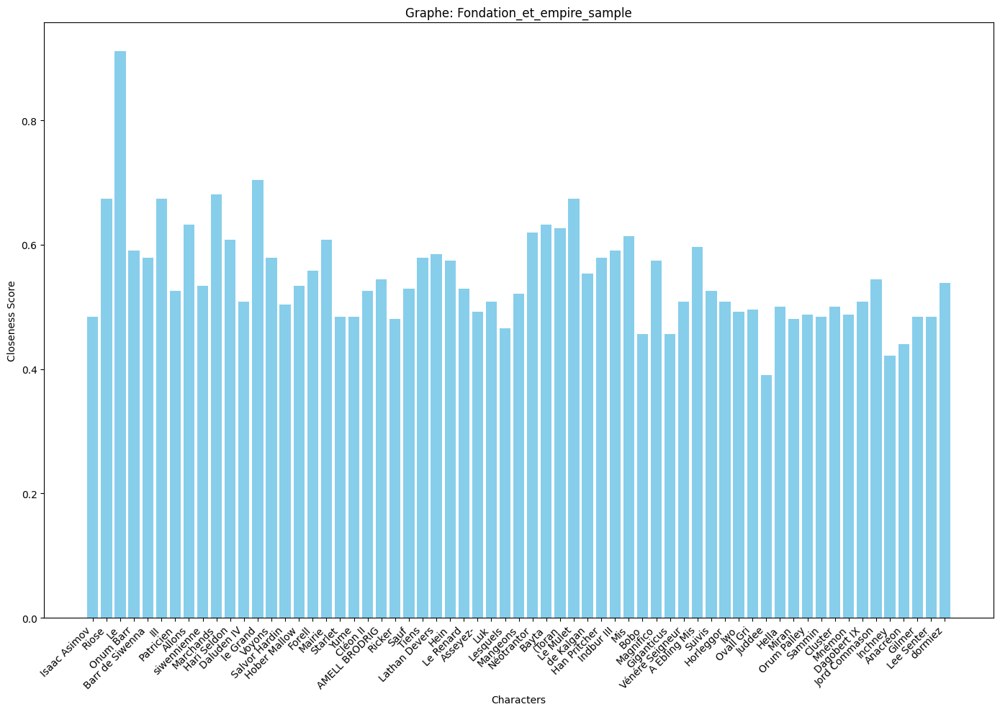

In [44]:
plot_closeness(graphs['Fondation_et_empire_sample'], 'Fondation_et_empire_sample')

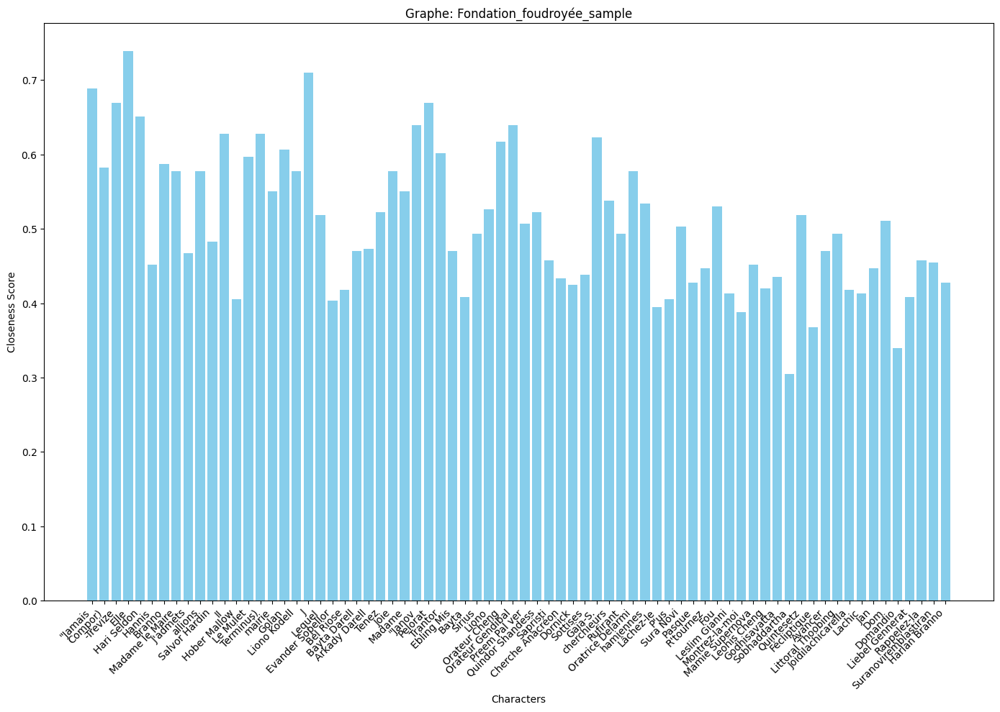

In [45]:
plot_closeness(graphs['Fondation_foudroyée_sample'], 'Fondation_foudroyée_sample')

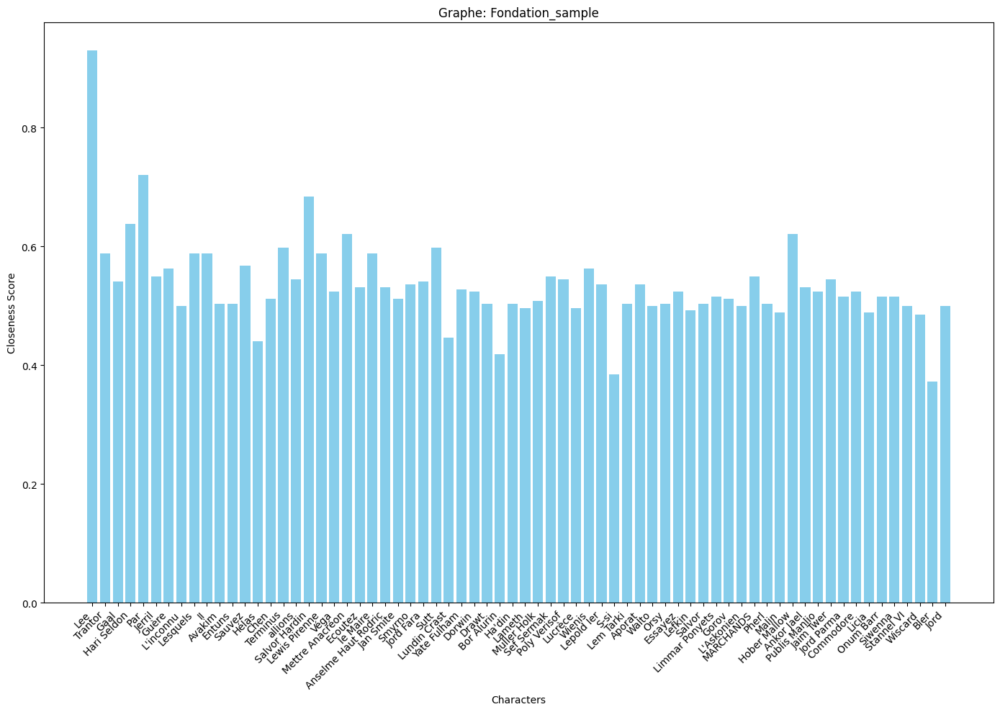

In [46]:
plot_closeness(graphs['Fondation_sample'], 'Fondation_sample')

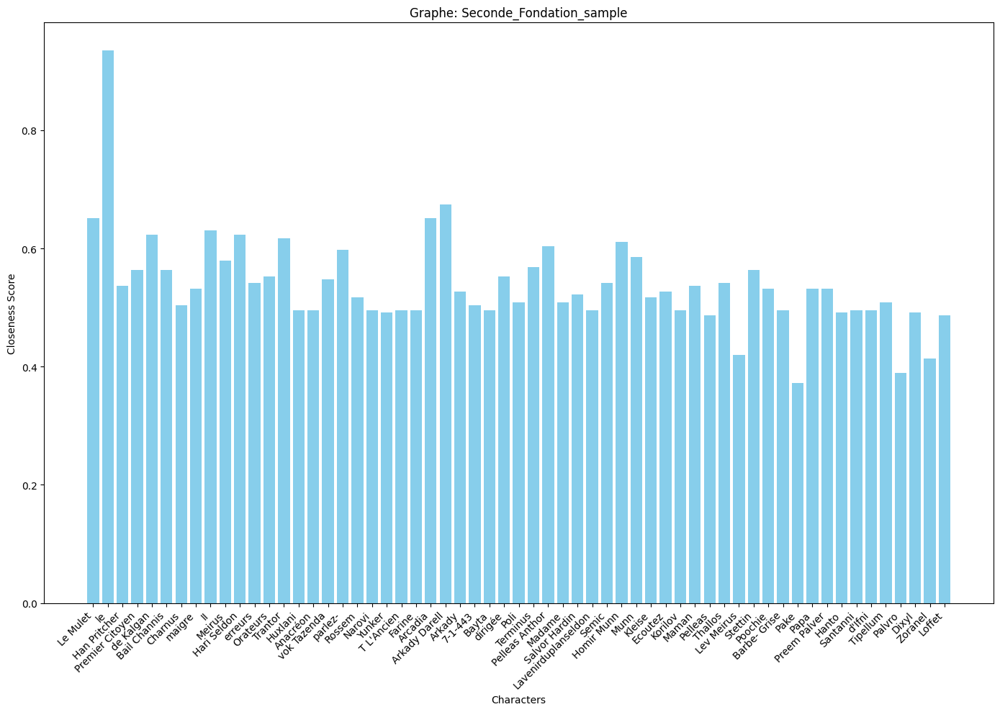

In [47]:
plot_closeness(graphs['Seconde_Fondation_sample'], 'Seconde_Fondation_sample')

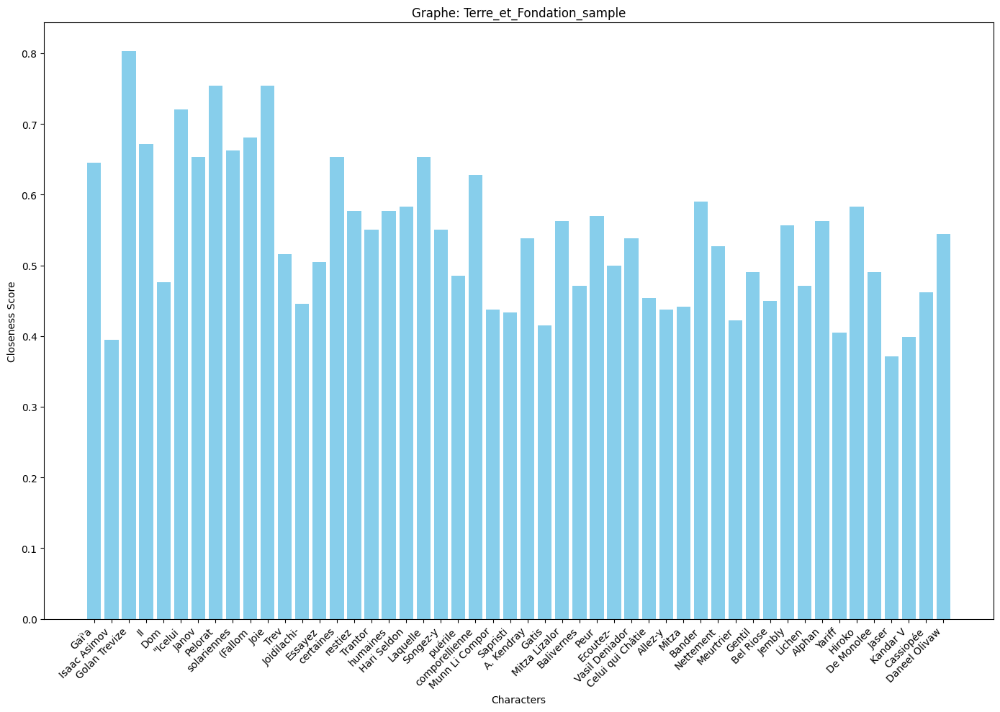

In [48]:
plot_closeness(graphs['Terre_et_Fondation_sample'], 'Terre_et_Fondation_sample')

In [49]:
def show_community_graph(graph, title):
    partition = community.best_partition(graph)
    fig, ax = plt.subplots(figsize=(14, 10))
    pos = nx.circular_layout(graph, scale = 20)
    labels = nx.get_edge_attributes(graph, 'weight')
    d = dict(graph.degree)
    nx.draw(
        graph, 
        pos,
        node_color=list(partition.values()),
        alpha = 0.75,
        with_labels=True, 
        nodelist=d, 
        node_size=[d[k]*200 for k in d],
        edgelist = labels,
        ax=ax
    )
    nx.draw_networkx_edge_labels(graph,pos,edge_labels=labels)
    plt.title(f'Graphe: {title}')
    plt.show()

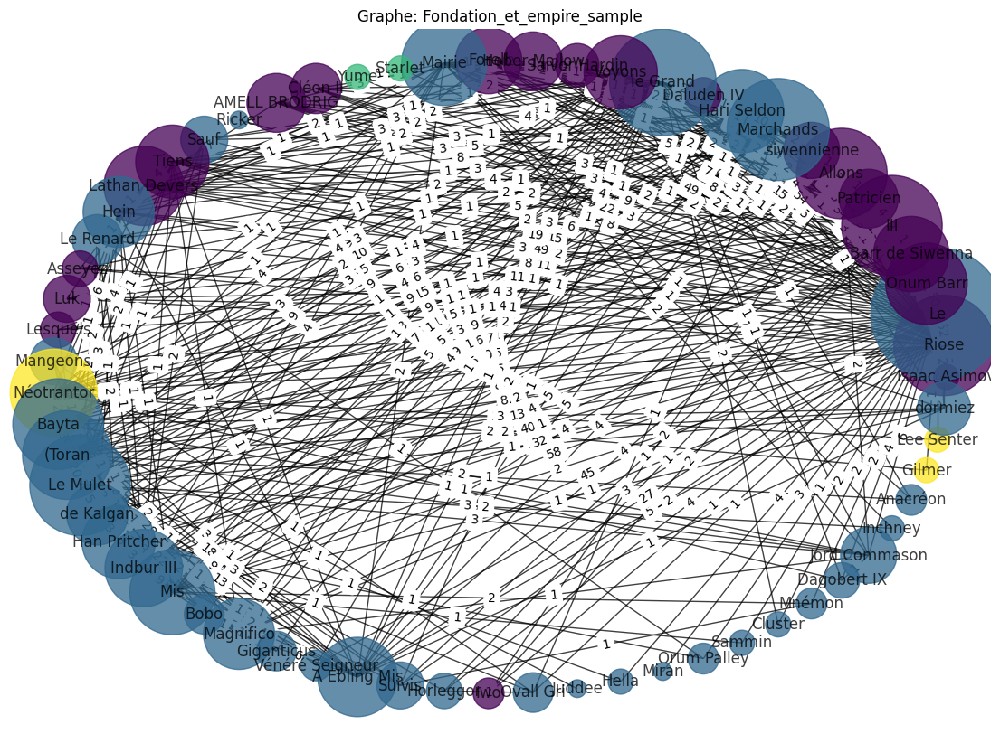

In [50]:
show_community_graph(graphs['Fondation_et_empire_sample'], 'Fondation_et_empire_sample')

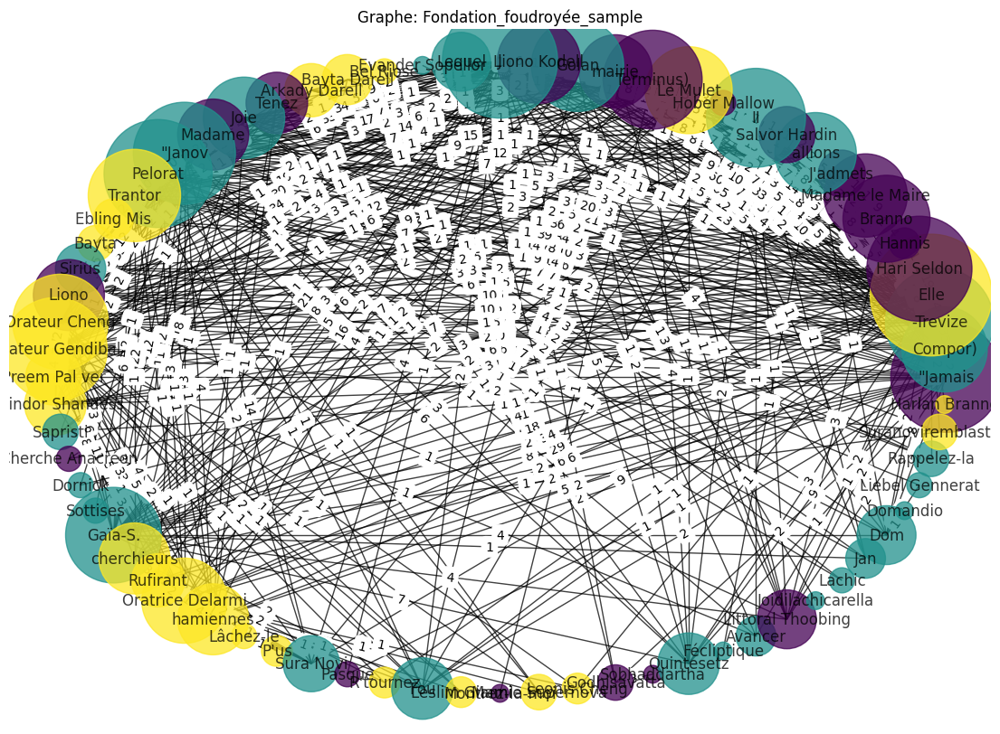

In [51]:
show_community_graph(graphs['Fondation_foudroyée_sample'], 'Fondation_foudroyée_sample')

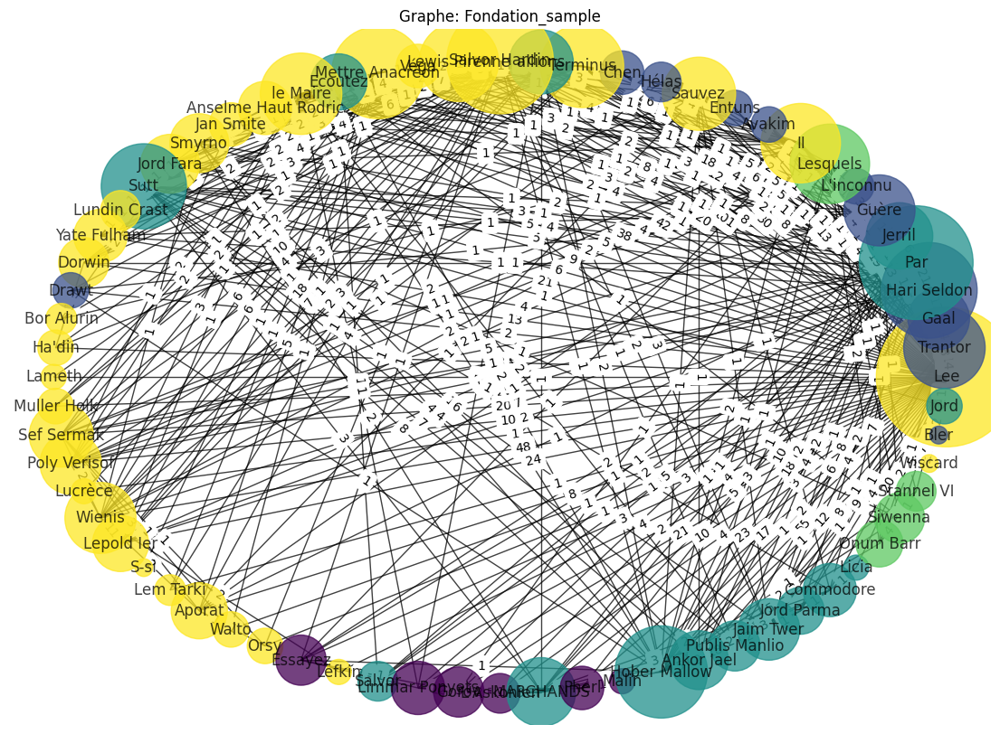

In [52]:
show_community_graph(graphs['Fondation_sample'], 'Fondation_sample')

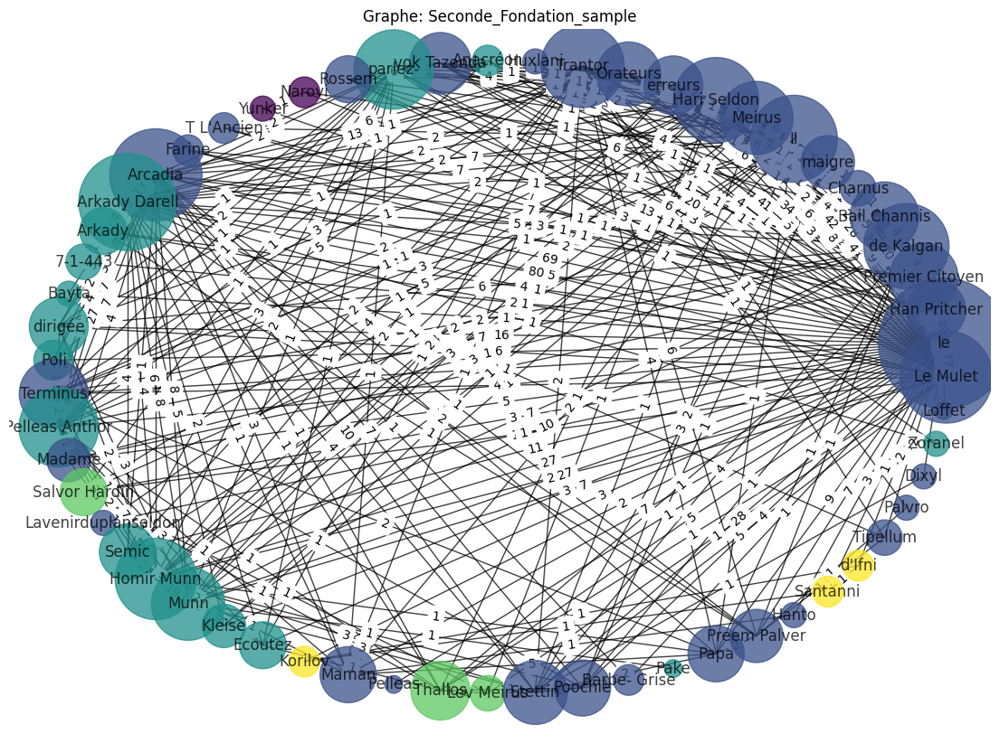

In [53]:
show_community_graph(graphs['Seconde_Fondation_sample'], 'Seconde_Fondation_sample')

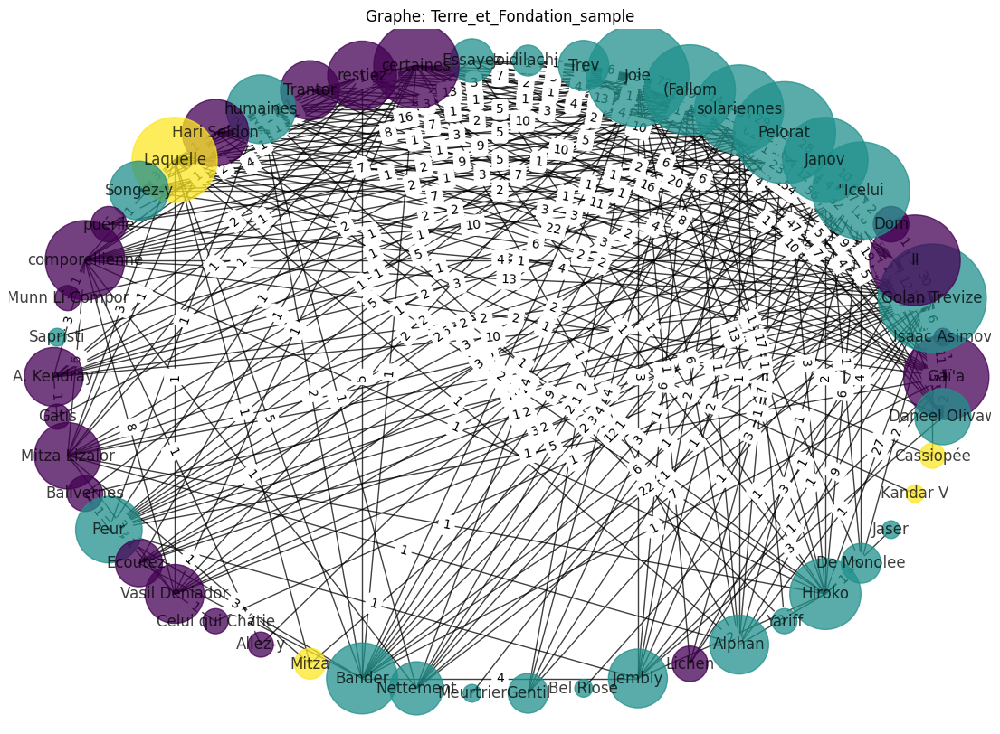

In [54]:
show_community_graph(graphs['Terre_et_Fondation_sample'], 'Terre_et_Fondation_sample')